# Klasifikasi Koin Rupiah (8 Classes - Split by Side)

Mengklasifikasikan koin rupiah berdasarkan nominal DAN sisi koin (angka/gambar):
- Rp 100 Angka, Rp 100 Gambar
- Rp 200 Angka, Rp 200 Gambar  
- Rp 500 Angka, Rp 500 Gambar
- Rp 1000 Angka, Rp 1000 Gambar

Menggunakan Edge Detection + Machine Learning dengan dataset yang sudah di-split per sisi koin.

**Dokumentasi lengkap**: Lihat [COIN-README.md](./COIN-README.md)

## 1. Import Libraries

In [30]:
import sys
import os
from pathlib import Path

# Add src to path
sys.path.append(str(Path('../src').resolve()))

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import warnings
warnings.filterwarnings('ignore')

## 2. Setup Paths dan Konfigurasi

Dataset: `dataset_splitted` dengan 8 kelas (4 nominal × 2 sisi).  
Image size 512×512, cropped to circle diameter untuk normalisasi skala.

In [31]:
# Directories
BASE_DIR = Path('..').resolve()
DATASET_DIR = BASE_DIR / 'dataset_splitted'  # Using splitted dataset (8 classes)
RESULTS_DIR = BASE_DIR / 'results' / 'coin_classification_splitted'
RESULTS_DIR.mkdir(parents=True, exist_ok=True)
(RESULTS_DIR / 'confusion_matrix').mkdir(exist_ok=True)
(RESULTS_DIR / 'visualizations').mkdir(exist_ok=True)

# Configuration
IMAGE_SIZE = (512, 512)
MAX_IMAGES_PER_CLASS = 50 # Set to None for unlimited
RANDOM_SEED = 42
TEST_SIZE = 0.2

np.random.seed(RANDOM_SEED)

print(f"Dataset: {DATASET_DIR}")
print(f"Config: {IMAGE_SIZE}, max {MAX_IMAGES_PER_CLASS or 'unlimited'} imgs/class, test {TEST_SIZE*100}%")

Dataset: D:\dev\semester5\pengolahan-citra\projek-edge-detection\dataset_splitted
Config: (512, 512), max 50 imgs/class, test 20.0%


## 3. Fungsi Preprocessing Koin

In [32]:
def apply_clahe(image, clip_limit=2.0, tile_grid_size=(8, 8)):
    """
    Apply CLAHE (Contrast Limited Adaptive Histogram Equalization)
    to normalize lighting variations across images.
    """
    if len(image.shape) == 3:
        # For color images, convert to LAB and apply CLAHE on L channel
        lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
        l, a, b = cv2.split(lab)
        clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)
        l_clahe = clahe.apply(l)
        lab_clahe = cv2.merge([l_clahe, a, b])
        result = cv2.cvtColor(lab_clahe, cv2.COLOR_LAB2BGR)
    else:
        # For grayscale images, apply CLAHE directly
        clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)
        result = clahe.apply(image)
    return result


def apply_canny_edge(image, use_clahe=True):
    """Apply Canny edge detection with optional CLAHE normalization"""
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray = image
    
    # Apply CLAHE to normalize lighting before edge detection
    if use_clahe:
        gray = apply_clahe(gray)
    
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    edges = cv2.Canny(blurred, 50, 150)
    return edges


def apply_sobel_edge(image, use_clahe=True):
    """Apply Sobel edge detection with optional CLAHE normalization"""
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray = image
    
    # Apply CLAHE to normalize lighting before edge detection
    if use_clahe:
        gray = apply_clahe(gray)
    
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
    sobel_combined = np.sqrt(sobel_x**2 + sobel_y**2)
    sobel_combined = np.uint8(sobel_combined / sobel_combined.max() * 255)
    return sobel_combined


def detect_and_segment_coin(image, edge_method='canny', use_clahe=True):
    """Detect coin using Hough Circle Transform and segment it"""
    if edge_method == 'canny':
        edges = apply_canny_edge(image, use_clahe=use_clahe)
    else:
        edges = apply_sobel_edge(image, use_clahe=use_clahe)
    
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray = image
    
    gray_blurred = cv2.GaussianBlur(gray, (9, 9), 2)
    
    circles = cv2.HoughCircles(
        gray_blurred,
        cv2.HOUGH_GRADIENT,
        dp=1,
        minDist=50,
        param1=100,
        param2=30,
        minRadius=20,
        maxRadius=200
    )
    
    segmented = image.copy()
    circle_info = None
    
    if circles is not None:
        circles = np.uint16(np.around(circles))
        circle = circles[0, 0]
        x, y, radius = circle[0], circle[1], circle[2]
        circle_info = (x, y, radius)
        
        mask = np.zeros(gray.shape, dtype=np.uint8)
        cv2.circle(mask, (x, y), radius, 255, -1)
        
        if len(image.shape) == 3:
            segmented = cv2.bitwise_and(image, image, mask=mask)
        else:
            segmented = cv2.bitwise_and(image, image, mask=mask)
    
    return segmented, circle_info, edges

## 4. Fungsi Feature Extraction

In [33]:
def extract_coin_features(segmented_image, edges, circle_info):
    """Extract comprehensive features from segmented coin (41 features total)"""
    features = []
    
    if len(segmented_image.shape) == 3:
        gray = cv2.cvtColor(segmented_image, cv2.COLOR_BGR2GRAY)
    else:
        gray = segmented_image
    
    # 1. TEXTURE FEATURES (12 features)
    edge_density = np.sum(edges > 0) / edges.size
    features.append(edge_density)
    
    edge_mean = np.mean(edges)
    edge_std = np.std(edges)
    edge_max = np.max(edges)
    features.extend([edge_mean, edge_std, edge_max])
    
    edge_hist, _ = np.histogram(edges.flatten(), bins=8, range=(0, 256))
    edge_hist = edge_hist / (edge_hist.sum() + 1e-6)
    features.extend(edge_hist)
    
    # 2. SHAPE FEATURES (4 features)
    if circle_info is not None:
        x, y, radius = circle_info
        normalized_radius = radius / max(gray.shape)
        features.append(normalized_radius)
        
        center_x = x / gray.shape[1]
        center_y = y / gray.shape[0]
        features.extend([center_x, center_y])
        
        mask = np.zeros(gray.shape, dtype=np.uint8)
        cv2.circle(mask, (x, y), radius, 255, -1)
        masked_edges = cv2.bitwise_and(edges, edges, mask=mask)
        
        contours, _ = cv2.findContours(masked_edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        if len(contours) > 0:
            largest_contour = max(contours, key=cv2.contourArea)
            area = cv2.contourArea(largest_contour)
            perimeter = cv2.arcLength(largest_contour, True)
            if perimeter > 0:
                circularity = (4 * np.pi * area) / (perimeter**2 + 1e-6)
            else:
                circularity = 0
            features.append(circularity)
        else:
            features.append(0)
    else:
        features.extend([0, 0, 0, 0])
    
    # 3. EDGE PATTERN FEATURES (12 features)
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
    
    magnitude = np.sqrt(sobel_x**2 + sobel_y**2)
    direction = np.arctan2(sobel_y, sobel_x)
    
    orientation_hist, _ = np.histogram(
        direction[magnitude > magnitude.mean()],
        bins=8,
        range=(-np.pi, np.pi)
    )
    orientation_hist = orientation_hist / (orientation_hist.sum() + 1e-6)
    features.extend(orientation_hist)
    
    features.extend([
        np.mean(magnitude),
        np.std(magnitude),
        np.percentile(magnitude, 75),
        np.percentile(magnitude, 90)
    ])
    
    # 4. SPATIAL FEATURES (4 features)
    h, w = edges.shape
    quadrants = [
        edges[0:h//2, 0:w//2],
        edges[0:h//2, w//2:w],
        edges[h//2:h, 0:w//2],
        edges[h//2:h, w//2:w]
    ]
    
    for quad in quadrants:
        quad_density = np.sum(quad > 0) / quad.size if quad.size > 0 else 0
        features.append(quad_density)
    
    # 5. TEXTURE FEATURES (3 features)
    kernel_size = 5
    local_mean = cv2.blur(gray.astype(float), (kernel_size, kernel_size))
    local_var = cv2.blur((gray.astype(float) - local_mean)**2, (kernel_size, kernel_size))
    
    features.extend([
        np.mean(local_var),
        np.std(local_var),
        np.percentile(local_var, 75)
    ])
    
    return np.array(features, dtype=np.float32)

## 5. Fungsi Data Augmentation

In [34]:
def augment_image(image):
    """Apply augmentation: rotation, flip, brightness (8x total)"""
    augmented = [image]
    
    for angle in [90, 180, 270]:
        h, w = image.shape[:2]
        center = (w // 2, h // 2)
        M = cv2.getRotationMatrix2D(center, angle, 1.0)
        rotated = cv2.warpAffine(image, M, (w, h))
        augmented.append(rotated)
    
    flipped_h = cv2.flip(image, 1)
    flipped_v = cv2.flip(image, 0)
    augmented.extend([flipped_h, flipped_v])
    
    bright = cv2.convertScaleAbs(image, alpha=1.2, beta=20)
    dark = cv2.convertScaleAbs(image, alpha=0.8, beta=-20)
    augmented.extend([bright, dark])
    
    return augmented

## 6. Load dan Eksplorasi Dataset

In [35]:
# Build class names from nested folder structure: "Koin Rp XXX/angka" and "Koin Rp XXX/gambar"
class_names = []
coin_types = sorted([d.name for d in DATASET_DIR.iterdir() if d.is_dir()])

for coin_type in coin_types:
    coin_dir = DATASET_DIR / coin_type
    sides = sorted([s.name for s in coin_dir.iterdir() if s.is_dir()])
    for side in sides:
        class_name = f"{coin_type} - {side}"
        class_names.append(class_name)

print(f"Total Classes: {len(class_names)}")
print(f"Classes: {class_names}\n")

# Count images per class
total_images = 0
for cls_name in class_names:
    # Parse class name back to path: "Koin Rp 100 - angka" -> "Koin Rp 100/angka"
    parts = cls_name.rsplit(' - ', 1)
    coin_type, side = parts[0], parts[1]
    cls_dir = DATASET_DIR / coin_type / side
    images = list(cls_dir.glob('*.jpg')) + list(cls_dir.glob('*.png')) + list(cls_dir.glob('*.jpeg')) + list(cls_dir.glob('*.JPG'))
    print(f"{cls_name}: {len(images)} images")
    total_images += len(images)

print(f"\nTotal images: {total_images}")

Total Classes: 8
Classes: ['Koin Rp 100 - angka', 'Koin Rp 100 - gambar', 'Koin Rp 1000 - angka', 'Koin Rp 1000 - gambar', 'Koin Rp 200 - angka', 'Koin Rp 200 - gambar', 'Koin Rp 500 - angka', 'Koin Rp 500 - gambar']

Koin Rp 100 - angka: 140 images
Koin Rp 100 - gambar: 116 images
Koin Rp 1000 - angka: 268 images
Koin Rp 1000 - gambar: 112 images
Koin Rp 200 - angka: 132 images
Koin Rp 200 - gambar: 138 images
Koin Rp 500 - angka: 236 images
Koin Rp 500 - gambar: 118 images

Total images: 1260


## 7. Visualisasi Sample Dataset

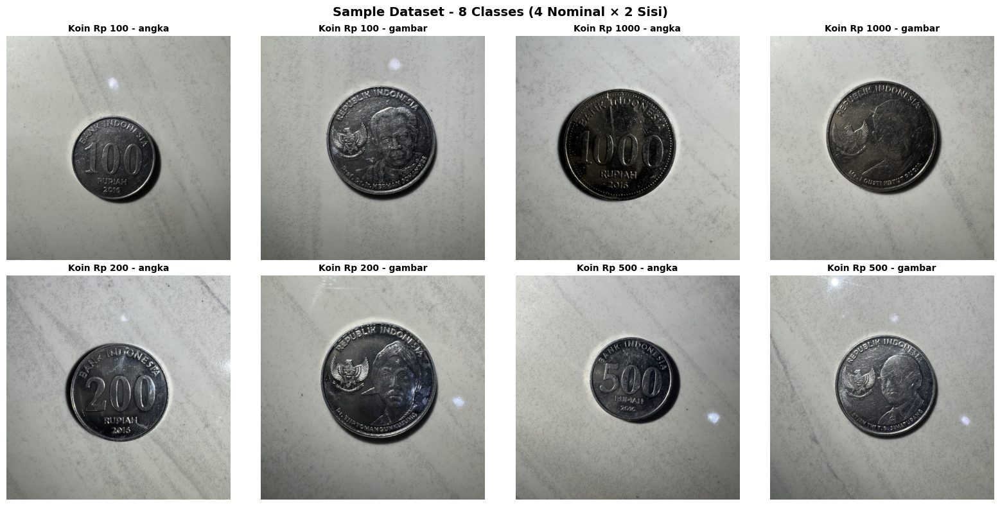

In [36]:
# Visualize 1 sample per class (8 classes = 2 rows x 4 cols)
fig, axes = plt.subplots(2, 4, figsize=(16, 8))
axes = axes.flatten()

for idx, cls_name in enumerate(class_names):
    # Parse class name to path
    parts = cls_name.rsplit(' - ', 1)
    coin_type, side = parts[0], parts[1]
    cls_dir = DATASET_DIR / coin_type / side
    images = list(cls_dir.glob('*.jpg')) + list(cls_dir.glob('*.png')) + list(cls_dir.glob('*.jpeg')) + list(cls_dir.glob('*.JPG'))
    
    if images:
        img_path = images[0]
        img = cv2.imread(str(img_path))
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        axes[idx].imshow(img_rgb)
        axes[idx].set_title(cls_name, fontsize=10, fontweight='bold')
        axes[idx].axis('off')

plt.suptitle('Sample Dataset - 8 Classes (4 Nominal × 2 Sisi)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(RESULTS_DIR / 'visualizations' / 'dataset_samples.png', dpi=150, bbox_inches='tight')
plt.show()

## 8. Visualisasi Pipeline Preprocessing

Menampilkan: Original → CLAHE → Sobel Edge → Hough Circle → Cropped (final input for feature extraction)

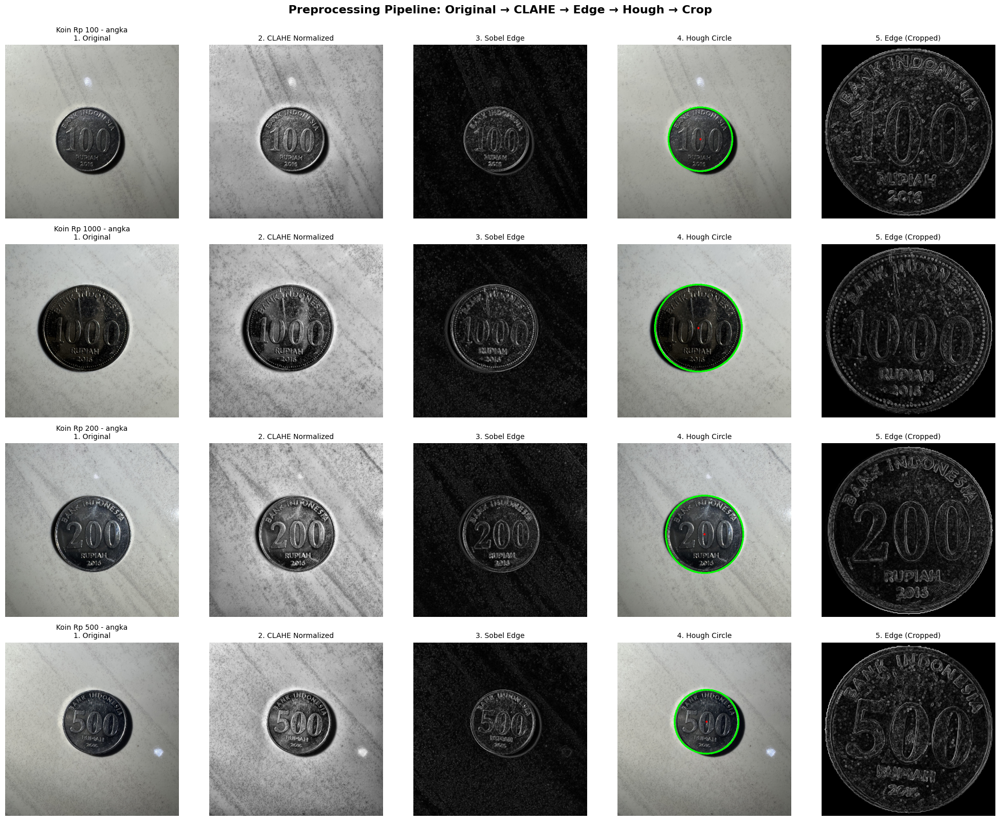


Pipeline Summary:
1. Original: Load and resize to 512x512
2. CLAHE: Normalize lighting variations
3. Sobel Edge: Detect edges on normalized image
4. Hough Circle: Detect coin boundary
5. Cropped: Crop to circle bounding box, resize to 512x512 (scale normalization)


In [37]:
# Import crop function
import sys
sys.path.insert(0, str(Path('..').resolve()))
from preprocessing import crop_coin_to_circle

# Visualize preprocessing pipeline for a subset of classes (4 samples to keep it readable)
sample_classes = class_names[::2]  # Every other class

fig, axes = plt.subplots(len(sample_classes), 5, figsize=(20, len(sample_classes) * 4))

for idx, cls_name in enumerate(sample_classes):
    # Parse class name to path
    parts = cls_name.rsplit(' - ', 1)
    coin_type, side = parts[0], parts[1]
    cls_dir = DATASET_DIR / coin_type / side
    images = list(cls_dir.glob('*.jpg')) + list(cls_dir.glob('*.png')) + list(cls_dir.glob('*.jpeg')) + list(cls_dir.glob('*.JPG'))
    
    if images:
        img_path = images[0]
        img = cv2.imread(str(img_path))
        img_resized = cv2.resize(img, IMAGE_SIZE)
        img_rgb = cv2.cvtColor(img_resized, cv2.COLOR_BGR2RGB)
        
        # Show CLAHE normalization effect
        gray = cv2.cvtColor(img_resized, cv2.COLOR_BGR2GRAY)
        gray_clahe = apply_clahe(gray)
        
        # Apply Sobel edge detection with CLAHE
        segmented, circle_info, edges = detect_and_segment_coin(img_resized, edge_method='sobel', use_clahe=True)
        
        # Draw circle on original for visualization
        img_with_circle = img_resized.copy()
        if circle_info:
            x, y, r = circle_info
            cv2.circle(img_with_circle, (x, y), r, (0, 255, 0), 3)
            cv2.circle(img_with_circle, (x, y), 3, (0, 0, 255), -1)
        
        # Crop to circle diameter
        cropped = crop_coin_to_circle(segmented, circle_info, IMAGE_SIZE)
        
        # Apply edge detection to cropped version (with CLAHE)
        edges_cropped = apply_sobel_edge(cropped, use_clahe=True)
        
        # Plot pipeline
        axes[idx, 0].imshow(img_rgb)
        axes[idx, 0].set_title(f'{cls_name}\n1. Original', fontsize=10)
        axes[idx, 0].axis('off')
        
        axes[idx, 1].imshow(gray_clahe, cmap='gray')
        axes[idx, 1].set_title('2. CLAHE Normalized', fontsize=10)
        axes[idx, 1].axis('off')
        
        axes[idx, 2].imshow(edges, cmap='gray')
        axes[idx, 2].set_title('3. Sobel Edge', fontsize=10)
        axes[idx, 2].axis('off')
        
        axes[idx, 3].imshow(cv2.cvtColor(img_with_circle, cv2.COLOR_BGR2RGB))
        axes[idx, 3].set_title('4. Hough Circle', fontsize=10)
        axes[idx, 3].axis('off')
        
        axes[idx, 4].imshow(edges_cropped, cmap='gray')
        axes[idx, 4].set_title('5. Edge (Cropped)', fontsize=10)
        axes[idx, 4].axis('off')

plt.suptitle('Preprocessing Pipeline: Original → CLAHE → Edge → Hough → Crop', 
             fontsize=16, fontweight='bold', y=0.995)
plt.tight_layout()
plt.savefig(RESULTS_DIR / 'visualizations' / 'preprocessing_pipeline.png', dpi=150, bbox_inches='tight')
plt.show()

print("\nPipeline Summary:")
print("1. Original: Load and resize to 512x512")
print("2. CLAHE: Normalize lighting variations")
print("3. Sobel Edge: Detect edges on normalized image")
print("4. Hough Circle: Detect coin boundary")
print("5. Cropped: Crop to circle bounding box, resize to 512x512 (scale normalization)")

## 9. Load dan Extract Features (Dengan Augmentation)

In [38]:
def load_and_extract_features(dataset_dir, class_names, edge_method='canny', apply_augmentation=False, max_images=None):
    """
    Load images and extract features from CROPPED version only (normalized scale)
    
    Supports nested folder structure: dataset_dir/CoinType/Side/images
    
    Args:
        dataset_dir: Path to dataset directory
        class_names: List of class names in format "Koin Rp XXX - side"
        edge_method: 'canny' or 'sobel'
        apply_augmentation: Whether to apply data augmentation
        max_images: Maximum images per class (None = no limit)
    
    Returns:
        X: Feature matrix
        y: Labels
    """
    import sys
    sys.path.insert(0, str(Path('..').resolve()))
    from preprocessing import crop_coin_to_circle
    
    X = []
    y = []
    
    for label, cls_name in enumerate(class_names):
        # Parse class name to path: "Koin Rp 100 - angka" -> "Koin Rp 100/angka"
        parts = cls_name.rsplit(' - ', 1)
        coin_type, side = parts[0], parts[1]
        cls_dir = dataset_dir / coin_type / side
        
        images = list(cls_dir.glob('*.jpg')) + list(cls_dir.glob('*.png')) + list(cls_dir.glob('*.jpeg')) + list(cls_dir.glob('*.JPG'))
        
        # Limit images per class if specified
        if max_images is not None and len(images) > max_images:
            np.random.shuffle(images)
            images = images[:max_images]
        
        print(f"Processing {cls_name}: {len(images)} images", end='')
        
        success_count = 0
        for img_path in images:
            # Load and resize
            img = cv2.imread(str(img_path))
            if img is None:
                continue
            
            img_resized = cv2.resize(img, IMAGE_SIZE)
            
            # Apply augmentation if enabled
            if apply_augmentation:
                augmented_images = augment_image(img_resized)
            else:
                augmented_images = [img_resized]
            
            # Extract features from each augmented image
            for aug_img in augmented_images:
                # 1. Detect circle on original image
                segmented_original, circle_info, _ = detect_and_segment_coin(aug_img, edge_method)
                
                # Only add if circle detected (for better quality)
                if circle_info is not None:
                    # 2. Crop to circle diameter and resize (NORMALIZES SCALE)
                    cropped = crop_coin_to_circle(segmented_original, circle_info, IMAGE_SIZE)
                    
                    # 3. Apply edge detection to cropped version
                    if edge_method == 'canny':
                        edges_cropped = apply_canny_edge(cropped)
                    else:
                        edges_cropped = apply_sobel_edge(cropped)
                    
                    # 4. Extract features from CROPPED version only (35 features)
                    # Circle info for cropped image (centered, fills the image)
                    h, w = cropped.shape[:2]
                    circle_info_cropped = (w//2, h//2, min(w, h)//2)
                    
                    features = extract_coin_features(cropped, edges_cropped, circle_info_cropped)
                    
                    X.append(features)
                    y.append(label)
                    success_count += 1
        
        aug_text = " (with augmentation)" if apply_augmentation else ""
        print(f" -> {success_count} samples{aug_text}")
    
    X = np.array(X)
    y = np.array(y)
    
    return X, y

### 9.1 Extract Features dengan Canny Edge Detection

Using cropped version only: coin is cropped to circle diameter and resized to 512×512 for normalized scale.

In [39]:
print("="*70)
print("CANNY EDGE DETECTION + CROPPING + AUGMENTATION (8 CLASSES)")
print("="*70)

# Extract features with Canny and augmentation
X_canny, y_canny = load_and_extract_features(
    DATASET_DIR, 
    class_names, 
    edge_method='canny',
    apply_augmentation=True,
    max_images=MAX_IMAGES_PER_CLASS
)

print(f"\nTotal samples (Canny): {len(X_canny)}")
print(f"Feature dimensions: {X_canny.shape[1]}")
print(f"Classes: {len(class_names)}")

# Check balance
unique, counts = np.unique(y_canny, return_counts=True)
print("\nDistribusi data per kelas:")
for cls_idx, count in zip(unique, counts):
    print(f"  {class_names[cls_idx]}: {count} samples")

CANNY EDGE DETECTION + CROPPING + AUGMENTATION (8 CLASSES)
Processing Koin Rp 100 - angka: 50 images -> 400 samples (with augmentation)
Processing Koin Rp 100 - gambar: 50 images -> 400 samples (with augmentation)
Processing Koin Rp 100 - gambar: 50 images -> 400 samples (with augmentation)
Processing Koin Rp 1000 - angka: 50 images -> 400 samples (with augmentation)
Processing Koin Rp 1000 - angka: 50 images -> 400 samples (with augmentation)
Processing Koin Rp 1000 - gambar: 50 images -> 400 samples (with augmentation)
Processing Koin Rp 1000 - gambar: 50 images -> 400 samples (with augmentation)
Processing Koin Rp 200 - angka: 50 images -> 400 samples (with augmentation)
Processing Koin Rp 200 - angka: 50 images -> 400 samples (with augmentation)
Processing Koin Rp 200 - gambar: 50 images -> 400 samples (with augmentation)
Processing Koin Rp 200 - gambar: 50 images -> 400 samples (with augmentation)
Processing Koin Rp 500 - angka: 50 images -> 400 samples (with augmentation)
Process

### 9.2 Extract Features dengan Sobel Edge Detection

Using cropped version only: coin is cropped to circle diameter and resized to 512×512 for normalized scale.

In [40]:
print("="*70)
print("SOBEL EDGE DETECTION + CROPPING + AUGMENTATION (8 CLASSES)")
print("="*70)

# Extract features with Sobel and augmentation
X_sobel, y_sobel = load_and_extract_features(
    DATASET_DIR, 
    class_names, 
    edge_method='sobel',
    apply_augmentation=True,
    max_images=MAX_IMAGES_PER_CLASS
)

print(f"\nTotal samples (Sobel): {len(X_sobel)}")
print(f"Feature dimensions: {X_sobel.shape[1]}")
print(f"Classes: {len(class_names)}")

# Check balance
unique, counts = np.unique(y_sobel, return_counts=True)
print("\nDistribusi data per kelas:")
for cls_idx, count in zip(unique, counts):
    print(f"  {class_names[cls_idx]}: {count} samples")

SOBEL EDGE DETECTION + CROPPING + AUGMENTATION (8 CLASSES)
Processing Koin Rp 100 - angka: 50 images -> 400 samples (with augmentation)
Processing Koin Rp 100 - gambar: 50 images -> 400 samples (with augmentation)
Processing Koin Rp 100 - gambar: 50 images -> 400 samples (with augmentation)
Processing Koin Rp 1000 - angka: 50 images -> 400 samples (with augmentation)
Processing Koin Rp 1000 - angka: 50 images -> 400 samples (with augmentation)
Processing Koin Rp 1000 - gambar: 50 images -> 400 samples (with augmentation)
Processing Koin Rp 1000 - gambar: 50 images -> 400 samples (with augmentation)
Processing Koin Rp 200 - angka: 50 images -> 400 samples (with augmentation)
Processing Koin Rp 200 - angka: 50 images -> 400 samples (with augmentation)
Processing Koin Rp 200 - gambar: 50 images -> 400 samples (with augmentation)
Processing Koin Rp 200 - gambar: 50 images -> 400 samples (with augmentation)
Processing Koin Rp 500 - angka: 50 images -> 400 samples (with augmentation)
Process

## 10. Split Data Training dan Testing

In [41]:
# Split data for Canny
X_train_canny, X_test_canny, y_train_canny, y_test_canny = train_test_split(
    X_canny, y_canny, test_size=TEST_SIZE, random_state=RANDOM_SEED, stratify=y_canny
)

print("CANNY Edge Detection:")
print(f"  Training set: {X_train_canny.shape[0]} samples")
print(f"  Testing set: {X_test_canny.shape[0]} samples")

# Split data for Sobel
X_train_sobel, X_test_sobel, y_train_sobel, y_test_sobel = train_test_split(
    X_sobel, y_sobel, test_size=TEST_SIZE, random_state=RANDOM_SEED, stratify=y_sobel
)

print("\nSOBEL Edge Detection:")
print(f"  Training set: {X_train_sobel.shape[0]} samples")
print(f"  Testing set: {X_test_sobel.shape[0]} samples")

CANNY Edge Detection:
  Training set: 2560 samples
  Testing set: 640 samples

SOBEL Edge Detection:
  Training set: 2560 samples
  Testing set: 640 samples


## 11. Model Training: Random Forest

Melatih model Random Forest dengan features dari Canny dan Sobel edge detection.

### 11.1 Random Forest + Canny

In [42]:
print("Training Random Forest + Canny...")

scaler_rf_canny = StandardScaler()
X_train_canny_scaled = scaler_rf_canny.fit_transform(X_train_canny)
X_test_canny_scaled = scaler_rf_canny.transform(X_test_canny)

rf_canny = RandomForestClassifier(
    n_estimators=200,
    max_depth=20,
    min_samples_split=5,
    min_samples_leaf=2,
    random_state=RANDOM_SEED,
    n_jobs=-1
)

rf_canny.fit(X_train_canny_scaled, y_train_canny)
y_pred_rf_canny = rf_canny.predict(X_test_canny_scaled)
acc_rf_canny = accuracy_score(y_test_canny, y_pred_rf_canny)

print(f"Accuracy: {acc_rf_canny:.4f}\n")
print(classification_report(y_test_canny, y_pred_rf_canny, target_names=class_names))

Training Random Forest + Canny...
Accuracy: 0.8781

                       precision    recall  f1-score   support

  Koin Rp 100 - angka       0.82      0.88      0.85        80
 Koin Rp 100 - gambar       0.90      0.95      0.93        80
 Koin Rp 1000 - angka       0.90      0.90      0.90        80
Koin Rp 1000 - gambar       0.93      0.84      0.88        80
  Koin Rp 200 - angka       0.90      0.89      0.89        80
 Koin Rp 200 - gambar       0.85      0.94      0.89        80
  Koin Rp 500 - angka       0.85      0.86      0.86        80
 Koin Rp 500 - gambar       0.87      0.78      0.82        80

             accuracy                           0.88       640
            macro avg       0.88      0.88      0.88       640
         weighted avg       0.88      0.88      0.88       640

Accuracy: 0.8781

                       precision    recall  f1-score   support

  Koin Rp 100 - angka       0.82      0.88      0.85        80
 Koin Rp 100 - gambar       0.90      0.95  

### 11.2 Random Forest + Sobel

In [43]:
print("Training Random Forest + Sobel...")

scaler_rf_sobel = StandardScaler()
X_train_sobel_scaled = scaler_rf_sobel.fit_transform(X_train_sobel)
X_test_sobel_scaled = scaler_rf_sobel.transform(X_test_sobel)

rf_sobel = RandomForestClassifier(
    n_estimators=200,
    max_depth=20,
    min_samples_split=5,
    min_samples_leaf=2,
    random_state=RANDOM_SEED,
    n_jobs=-1
)

rf_sobel.fit(X_train_sobel_scaled, y_train_sobel)
y_pred_rf_sobel = rf_sobel.predict(X_test_sobel_scaled)
acc_rf_sobel = accuracy_score(y_test_sobel, y_pred_rf_sobel)

print(f"Accuracy: {acc_rf_sobel:.4f}\n")
print(classification_report(y_test_sobel, y_pred_rf_sobel, target_names=class_names))

Training Random Forest + Sobel...
Accuracy: 0.8469

                       precision    recall  f1-score   support

  Koin Rp 100 - angka       0.78      0.90      0.84        80
 Koin Rp 100 - gambar       0.87      0.94      0.90        80
 Koin Rp 1000 - angka       0.93      0.85      0.89        80
Koin Rp 1000 - gambar       0.83      0.80      0.82        80
  Koin Rp 200 - angka       0.81      0.91      0.86        80
 Koin Rp 200 - gambar       0.86      0.86      0.86        80
  Koin Rp 500 - angka       0.82      0.79      0.80        80
 Koin Rp 500 - gambar       0.89      0.72      0.80        80

             accuracy                           0.85       640
            macro avg       0.85      0.85      0.85       640
         weighted avg       0.85      0.85      0.85       640

Accuracy: 0.8469

                       precision    recall  f1-score   support

  Koin Rp 100 - angka       0.78      0.90      0.84        80
 Koin Rp 100 - gambar       0.87      0.94  

## 12. Model Training: Support Vector Machine (SVM)

### 12.1 SVM + Canny

In [44]:
print("Training SVM + Canny...")

svm_canny = SVC(
    kernel='rbf',
    C=10,
    gamma='scale',
    random_state=RANDOM_SEED
)

svm_canny.fit(X_train_canny_scaled, y_train_canny)
y_pred_svm_canny = svm_canny.predict(X_test_canny_scaled)
acc_svm_canny = accuracy_score(y_test_canny, y_pred_svm_canny)

print(f"Accuracy: {acc_svm_canny:.4f}\n")
print(classification_report(y_test_canny, y_pred_svm_canny, target_names=class_names))

Training SVM + Canny...
Accuracy: 0.8109

                       precision    recall  f1-score   support

  Koin Rp 100 - angka       0.74      0.75      0.75        80
 Koin Rp 100 - gambar       0.73      0.86      0.79        80
 Koin Rp 1000 - angka       0.84      0.89      0.86        80
Koin Rp 1000 - gambar       0.76      0.82      0.79        80
  Koin Rp 200 - angka       0.91      0.78      0.84        80
 Koin Rp 200 - gambar       0.85      0.94      0.89        80
  Koin Rp 500 - angka       0.89      0.79      0.83        80
 Koin Rp 500 - gambar       0.82      0.66      0.73        80

             accuracy                           0.81       640
            macro avg       0.82      0.81      0.81       640
         weighted avg       0.82      0.81      0.81       640



### 12.2 SVM + Sobel

In [45]:
print("Training SVM + Sobel...")

svm_sobel = SVC(
    kernel='rbf',
    C=10,
    gamma='scale',
    random_state=RANDOM_SEED
)

svm_sobel.fit(X_train_sobel_scaled, y_train_sobel)
y_pred_svm_sobel = svm_sobel.predict(X_test_sobel_scaled)
acc_svm_sobel = accuracy_score(y_test_sobel, y_pred_svm_sobel)

print(f"Accuracy: {acc_svm_sobel:.4f}\n")
print(classification_report(y_test_sobel, y_pred_svm_sobel, target_names=class_names))

Training SVM + Sobel...
Accuracy: 0.8125

                       precision    recall  f1-score   support

  Koin Rp 100 - angka       0.78      0.89      0.83        80
 Koin Rp 100 - gambar       0.76      0.89      0.82        80
 Koin Rp 1000 - angka       0.76      0.82      0.79        80
Koin Rp 1000 - gambar       0.76      0.75      0.75        80
  Koin Rp 200 - angka       0.86      0.82      0.84        80
 Koin Rp 200 - gambar       0.90      0.86      0.88        80
  Koin Rp 500 - angka       0.85      0.72      0.78        80
 Koin Rp 500 - gambar       0.88      0.74      0.80        80

             accuracy                           0.81       640
            macro avg       0.82      0.81      0.81       640
         weighted avg       0.82      0.81      0.81       640

Accuracy: 0.8125

                       precision    recall  f1-score   support

  Koin Rp 100 - angka       0.78      0.89      0.83        80
 Koin Rp 100 - gambar       0.76      0.89      0.82  

## 13. Perbandingan Hasil Semua Model

In [46]:
comparison_df = pd.DataFrame({
    'Model': [
        'Random Forest + Canny',
        'Random Forest + Sobel',
        'SVM + Canny',
        'SVM + Sobel'
    ],
    'Edge Detection': ['Canny', 'Sobel', 'Canny', 'Sobel'],
    'Classifier': ['Random Forest', 'Random Forest', 'SVM', 'SVM'],
    'Features': ['35 (Cropped)', '35 (Cropped)', '35 (Cropped)', '35 (Cropped)'],
    'Accuracy': [acc_rf_canny, acc_rf_sobel, acc_svm_canny, acc_svm_sobel]
})

comparison_df = comparison_df.sort_values('Accuracy', ascending=False).reset_index(drop=True)

print("="*80)
print("MODEL COMPARISON (All using Cropped Features Only)")
print("="*80)
print(comparison_df.to_string(index=False))
print("="*80)
print(f"\nBEST MODEL: {comparison_df.iloc[0]['Model']}")
print(f"  Accuracy: {comparison_df.iloc[0]['Accuracy']:.4f} ({comparison_df.iloc[0]['Accuracy']*100:.2f}%)")
print(f"  Features: {comparison_df.iloc[0]['Features']}")
print("="*80)

comparison_df.to_csv(RESULTS_DIR / 'model_comparison.csv', index=False)

MODEL COMPARISON (All using Cropped Features Only)
                Model Edge Detection    Classifier     Features  Accuracy
Random Forest + Canny          Canny Random Forest 35 (Cropped)  0.878125
Random Forest + Sobel          Sobel Random Forest 35 (Cropped)  0.846875
          SVM + Sobel          Sobel           SVM 35 (Cropped)  0.812500
          SVM + Canny          Canny           SVM 35 (Cropped)  0.810937

BEST MODEL: Random Forest + Canny
  Accuracy: 0.8781 (87.81%)
  Features: 35 (Cropped)


### 13.1 Visualisasi Perbandingan Accuracy

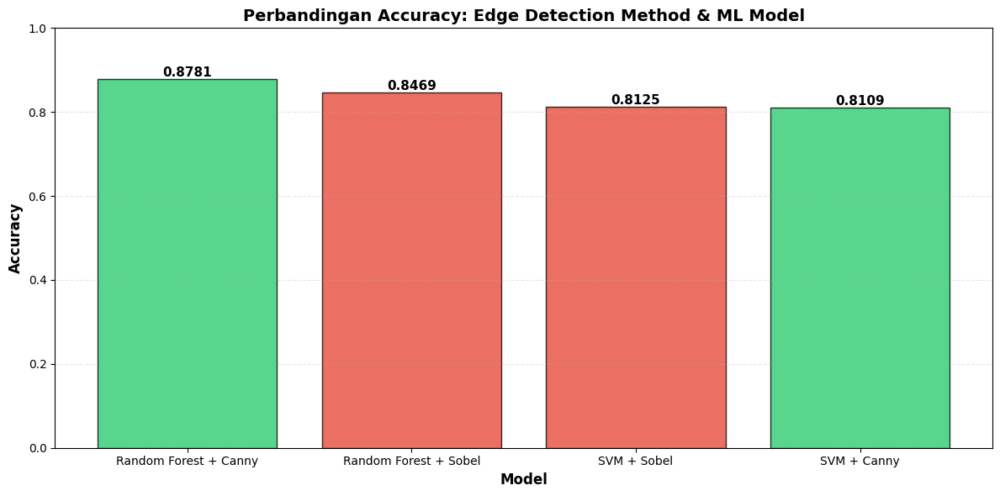

In [47]:
# Plot accuracy comparison
fig, ax = plt.subplots(figsize=(12, 6))

colors = ['#2ecc71' if 'Canny' in model else '#e74c3c' for model in comparison_df['Model']]
bars = ax.bar(comparison_df['Model'], comparison_df['Accuracy'], color=colors, alpha=0.8, edgecolor='black')

# Add value labels on bars
for bar in bars:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2., height,
            f'{height:.4f}',
            ha='center', va='bottom', fontsize=11, fontweight='bold')

ax.set_xlabel('Model', fontsize=12, fontweight='bold')
ax.set_ylabel('Accuracy', fontsize=12, fontweight='bold')
ax.set_title('Perbandingan Accuracy: Edge Detection Method & ML Model', fontsize=14, fontweight='bold')
ax.set_ylim(0, 1.0)
ax.grid(axis='y', alpha=0.3, linestyle='--')
plt.tight_layout()

plt.savefig(RESULTS_DIR / 'visualizations' / 'accuracy_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

## 13.2 Feature Importance Analysis

Analyze which features contribute most to classification to determine if we can reduce the feature set.

In [48]:
# Define feature names for interpretability
feature_names = [
    # Texture Features (12)
    'edge_density',
    'edge_mean', 'edge_std', 'edge_max',
    'edge_hist_0', 'edge_hist_1', 'edge_hist_2', 'edge_hist_3',
    'edge_hist_4', 'edge_hist_5', 'edge_hist_6', 'edge_hist_7',
    
    # Shape Features (4)
    'normalized_radius', 'center_x', 'center_y', 'circularity',
    
    # Edge Pattern Features (12)
    'orient_hist_0', 'orient_hist_1', 'orient_hist_2', 'orient_hist_3',
    'orient_hist_4', 'orient_hist_5', 'orient_hist_6', 'orient_hist_7',
    'magnitude_mean', 'magnitude_std', 'magnitude_p75', 'magnitude_p90',
    
    # Spatial Features (4)
    'quad_density_tl', 'quad_density_tr', 'quad_density_bl', 'quad_density_br',
    
    # Local Variance Features (3)
    'local_var_mean', 'local_var_std', 'local_var_p75'
]

print(f"Total features defined: {len(feature_names)}")

# Get feature importance from best Random Forest model (Sobel)
importances = rf_sobel.feature_importances_
indices = np.argsort(importances)[::-1]

# Create DataFrame for analysis
importance_df = pd.DataFrame({
    'Feature': [feature_names[i] for i in indices],
    'Importance': importances[indices],
    'Rank': range(1, len(feature_names) + 1)
})

# Calculate cumulative importance
importance_df['Cumulative'] = importance_df['Importance'].cumsum()
importance_df['Cumulative_Pct'] = importance_df['Cumulative'] / importance_df['Importance'].sum() * 100

print("\n" + "="*70)
print("FEATURE IMPORTANCE RANKING (Random Forest + Sobel)")
print("="*70)
print(importance_df.to_string(index=False))
print("="*70)

Total features defined: 35

FEATURE IMPORTANCE RANKING (Random Forest + Sobel)
          Feature  Importance  Rank  Cumulative  Cumulative_Pct
      edge_hist_1    0.090674     1    0.090674        9.067430
      edge_hist_2    0.059235     2    0.149909       14.990897
      edge_hist_0    0.055444     3    0.205353       20.535294
    magnitude_std    0.048872     4    0.254225       25.422451
    local_var_std    0.048226     5    0.302450       30.245037
      edge_hist_3    0.043857     6    0.346308       34.630776
    magnitude_p90    0.040895     7    0.387203       38.720303
        edge_mean    0.039997     8    0.427201       42.720051
   local_var_mean    0.039799     9    0.466999       46.699937
    magnitude_p75    0.039370    10    0.506369       50.636949
    local_var_p75    0.036592    11    0.542962       54.296167
    orient_hist_5    0.031004    12    0.573966       57.396599
     edge_density    0.030910    13    0.604876       60.487561
      edge_hist_4    0.03

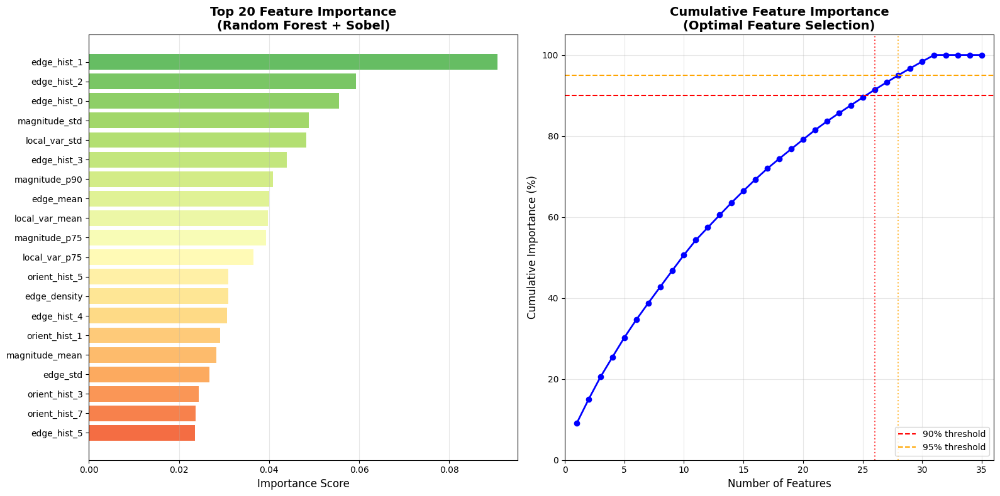


FEATURE SELECTION RECOMMENDATIONS:
   • Top 26 features capture 90% importance
   • Top 28 features capture 95% importance
   • Total features: 35


In [49]:
# Visualize feature importance
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Plot 1: Feature Importance Bar Chart (Top 20)
top_n = 20
colors = plt.cm.RdYlGn_r(np.linspace(0.2, 0.8, top_n))
axes[0].barh(range(top_n), importance_df['Importance'].values[:top_n][::-1], color=colors[::-1])
axes[0].set_yticks(range(top_n))
axes[0].set_yticklabels(importance_df['Feature'].values[:top_n][::-1])
axes[0].set_xlabel('Importance Score', fontsize=12)
axes[0].set_title(f'Top {top_n} Feature Importance\n(Random Forest + Sobel)', fontsize=14, fontweight='bold')
axes[0].grid(axis='x', alpha=0.3)

# Plot 2: Cumulative Importance
axes[1].plot(range(1, len(feature_names) + 1), importance_df['Cumulative_Pct'].values, 
             'b-o', markersize=6, linewidth=2)
axes[1].axhline(y=90, color='r', linestyle='--', label='90% threshold')
axes[1].axhline(y=95, color='orange', linestyle='--', label='95% threshold')

# Find optimal cutoffs
n_features_90 = (importance_df['Cumulative_Pct'] >= 90).idxmax() + 1
n_features_95 = (importance_df['Cumulative_Pct'] >= 95).idxmax() + 1

axes[1].axvline(x=n_features_90, color='r', linestyle=':', alpha=0.7)
axes[1].axvline(x=n_features_95, color='orange', linestyle=':', alpha=0.7)

axes[1].set_xlabel('Number of Features', fontsize=12)
axes[1].set_ylabel('Cumulative Importance (%)', fontsize=12)
axes[1].set_title('Cumulative Feature Importance\n(Optimal Feature Selection)', fontsize=14, fontweight='bold')
axes[1].legend(loc='lower right')
axes[1].grid(alpha=0.3)
axes[1].set_xlim(0, len(feature_names) + 1)
axes[1].set_ylim(0, 105)

plt.tight_layout()
plt.savefig(RESULTS_DIR / 'visualizations' / 'feature_importance_analysis.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"\nFEATURE SELECTION RECOMMENDATIONS:")
print(f"   • Top {n_features_90} features capture 90% importance")
print(f"   • Top {n_features_95} features capture 95% importance")
print(f"   • Total features: {len(feature_names)}")

## 14. Confusion Matrix untuk Model Terbaik

Model terbaik: Random Forest + Canny
Accuracy: 0.8781



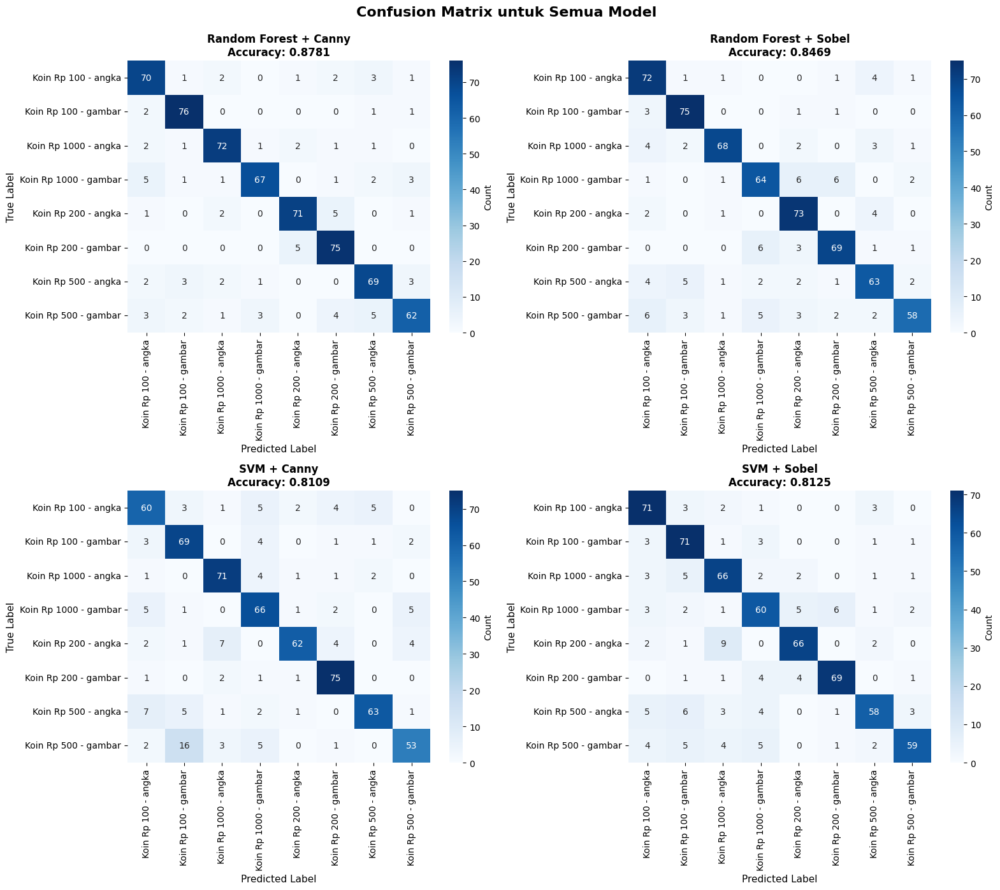

In [50]:
# Determine best model
best_model_row = comparison_df.iloc[0]
print(f"Model terbaik: {best_model_row['Model']}")
print(f"Accuracy: {best_model_row['Accuracy']:.4f}\n")

# Get predictions for all models
models_info = [
    ('Random Forest + Canny', y_test_canny, y_pred_rf_canny),
    ('Random Forest + Sobel', y_test_sobel, y_pred_rf_sobel),
    ('SVM + Canny', y_test_canny, y_pred_svm_canny),
    ('SVM + Sobel', y_test_sobel, y_pred_svm_sobel)
]

# Plot confusion matrices for all models
fig, axes = plt.subplots(2, 2, figsize=(16, 14))
axes = axes.flatten()

for idx, (model_name, y_true, y_pred) in enumerate(models_info):
    cm = confusion_matrix(y_true, y_pred)
    
    # Plot
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                xticklabels=class_names, yticklabels=class_names,
                ax=axes[idx], cbar_kws={'label': 'Count'})
    
    axes[idx].set_title(f'{model_name}\nAccuracy: {accuracy_score(y_true, y_pred):.4f}', 
                        fontsize=12, fontweight='bold')
    axes[idx].set_xlabel('Predicted Label', fontsize=11)
    axes[idx].set_ylabel('True Label', fontsize=11)

plt.suptitle('Confusion Matrix untuk Semua Model', fontsize=16, fontweight='bold', y=0.995)
plt.tight_layout()
plt.savefig(RESULTS_DIR / 'confusion_matrix' / 'all_models_confusion_matrix.png', dpi=150, bbox_inches='tight')
plt.show()

## 15. Analisis Per-Class Performance

In [51]:
from sklearn.metrics import precision_recall_fscore_support

models_info = [
    ('Random Forest + Canny', y_test_canny, y_pred_rf_canny),
    ('Random Forest + Sobel', y_test_sobel, y_pred_rf_sobel),
    ('SVM + Canny', y_test_canny, y_pred_svm_canny),
    ('SVM + Sobel', y_test_sobel, y_pred_svm_sobel)
]

per_class_results = []

for model_name, y_true, y_pred in models_info:
    precision, recall, f1, support = precision_recall_fscore_support(
        y_true, y_pred, labels=range(len(class_names)), zero_division=0
    )
    
    for idx, cls_name in enumerate(class_names):
        per_class_results.append({
            'Model': model_name,
            'Class': cls_name,
            'Precision': precision[idx],
            'Recall': recall[idx],
            'F1-Score': f1[idx],
            'Support': support[idx]
        })

per_class_df = pd.DataFrame(per_class_results)

for cls_name in class_names:
    print(f"\n{cls_name}:")
    cls_data = per_class_df[per_class_df['Class'] == cls_name]
    print(cls_data[['Model', 'Precision', 'Recall', 'F1-Score']].to_string(index=False))

per_class_df.to_csv(RESULTS_DIR / 'per_class_performance.csv', index=False)


Koin Rp 100 - angka:
                Model  Precision  Recall  F1-Score
Random Forest + Canny   0.823529  0.8750  0.848485
Random Forest + Sobel   0.782609  0.9000  0.837209
          SVM + Canny   0.740741  0.7500  0.745342
          SVM + Sobel   0.780220  0.8875  0.830409

Koin Rp 100 - gambar:
                Model  Precision  Recall  F1-Score
Random Forest + Canny   0.904762  0.9500  0.926829
Random Forest + Sobel   0.872093  0.9375  0.903614
          SVM + Canny   0.726316  0.8625  0.788571
          SVM + Sobel   0.755319  0.8875  0.816092

Koin Rp 1000 - angka:
                Model  Precision  Recall  F1-Score
Random Forest + Canny   0.900000  0.9000  0.900000
Random Forest + Sobel   0.931507  0.8500  0.888889
          SVM + Canny   0.835294  0.8875  0.860606
          SVM + Sobel   0.758621  0.8250  0.790419

Koin Rp 1000 - gambar:
                Model  Precision  Recall  F1-Score
Random Forest + Canny   0.930556  0.8375  0.881579
Random Forest + Sobel   0.831169  0.8000 

### 15.1 Visualisasi F1-Score per Class

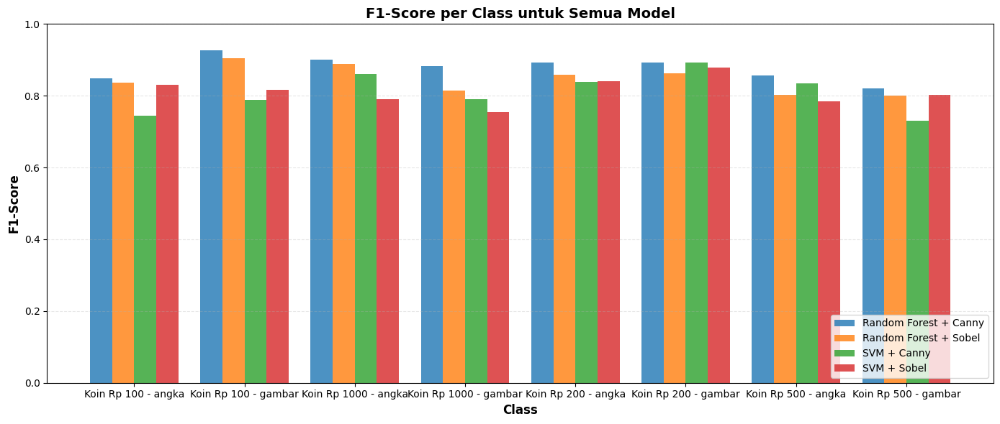

In [52]:
# Plot F1-Score per class for all models
fig, ax = plt.subplots(figsize=(14, 6))

x = np.arange(len(class_names))
width = 0.2

for idx, (model_name, _, _) in enumerate(models_info):
    model_data = per_class_df[per_class_df['Model'] == model_name]
    f1_scores = model_data['F1-Score'].values
    
    offset = (idx - 1.5) * width
    ax.bar(x + offset, f1_scores, width, label=model_name, alpha=0.8)

ax.set_xlabel('Class', fontsize=12, fontweight='bold')
ax.set_ylabel('F1-Score', fontsize=12, fontweight='bold')
ax.set_title('F1-Score per Class untuk Semua Model', fontsize=14, fontweight='bold')
ax.set_xticks(x)
ax.set_xticklabels(class_names, rotation=0)
ax.legend(loc='lower right')
ax.set_ylim(0, 1.0)
ax.grid(axis='y', alpha=0.3, linestyle='--')
plt.tight_layout()

plt.savefig(RESULTS_DIR / 'visualizations' / 'f1_score_per_class.png', dpi=150, bbox_inches='tight')
plt.show()

## Analisis Kesalahan Prediksi

Analisis model terbaik (Random Forest + Sobel) untuk memahami karakteristik misclassification.

In [53]:
misclassified_indices = np.where(y_test_sobel != y_pred_rf_sobel)[0]
correct_indices = np.where(y_test_sobel == y_pred_rf_sobel)[0]

print(f"Total test samples: {len(y_test_sobel)}")
print(f"Correct: {len(correct_indices)} ({len(correct_indices)/len(y_test_sobel)*100:.2f}%)")
print(f"Misclassified: {len(misclassified_indices)} ({len(misclassified_indices)/len(y_test_sobel)*100:.2f}%)")

print("\nBreakdown per kelas:")
for cls_idx, cls_name in enumerate(class_names):
    class_mask = y_test_sobel == cls_idx
    class_total = np.sum(class_mask)
    class_misclassified = np.sum((y_test_sobel == cls_idx) & (y_pred_rf_sobel != cls_idx))
    
    print(f"  {cls_name}: {class_total} total, {class_misclassified} misclassified ({class_misclassified/class_total*100:.2f}%)")
    
    if class_misclassified > 0:
        misclass_mask = (y_test_sobel == cls_idx) & (y_pred_rf_sobel != cls_idx)
        predicted_as = y_pred_rf_sobel[misclass_mask]
        for pred_idx in range(len(class_names)):
            pred_count = np.sum(predicted_as == pred_idx)
            if pred_count > 0:
                print(f"      → {pred_count}x as {class_names[pred_idx]}")

Total test samples: 640
Correct: 542 (84.69%)
Misclassified: 98 (15.31%)

Breakdown per kelas:
  Koin Rp 100 - angka: 80 total, 8 misclassified (10.00%)
      → 1x as Koin Rp 100 - gambar
      → 1x as Koin Rp 1000 - angka
      → 1x as Koin Rp 200 - gambar
      → 4x as Koin Rp 500 - angka
      → 1x as Koin Rp 500 - gambar
  Koin Rp 100 - gambar: 80 total, 5 misclassified (6.25%)
      → 3x as Koin Rp 100 - angka
      → 1x as Koin Rp 200 - angka
      → 1x as Koin Rp 200 - gambar
  Koin Rp 1000 - angka: 80 total, 12 misclassified (15.00%)
      → 4x as Koin Rp 100 - angka
      → 2x as Koin Rp 100 - gambar
      → 2x as Koin Rp 200 - angka
      → 3x as Koin Rp 500 - angka
      → 1x as Koin Rp 500 - gambar
  Koin Rp 1000 - gambar: 80 total, 16 misclassified (20.00%)
      → 1x as Koin Rp 100 - angka
      → 1x as Koin Rp 1000 - angka
      → 6x as Koin Rp 200 - angka
      → 6x as Koin Rp 200 - gambar
      → 2x as Koin Rp 500 - gambar
  Koin Rp 200 - angka: 80 total, 7 misclassifi

In [54]:
def get_sample_images_for_misclassifications(dataset_dir, class_names, y_test, y_pred, 
                                              max_samples_per_class=3, edge_method='sobel'):
    """Get sample images for misclassified predictions"""
    misclass_indices = np.where(y_test != y_pred)[0]
    samples_per_class = {cls_idx: [] for cls_idx in range(len(class_names))}
    
    for idx in misclass_indices:
        true_label = y_test[idx]
        pred_label = y_pred[idx]
        samples_per_class[true_label].append((true_label, pred_label))
    
    result = []
    
    for cls_idx, cls_name in enumerate(class_names):
        if len(samples_per_class[cls_idx]) == 0:
            continue
        
        cls_dir = dataset_dir / cls_name
        images = list(cls_dir.glob('*.jpg')) + list(cls_dir.glob('*.png')) + list(cls_dir.glob('*.jpeg'))
        
        if len(images) == 0:
            continue
        
        num_samples = min(max_samples_per_class, len(samples_per_class[cls_idx]))
        
        for i in range(num_samples):
            if i < len(samples_per_class[cls_idx]):
                true_label, pred_label = samples_per_class[cls_idx][i]
                
                np.random.seed(RANDOM_SEED + cls_idx + i)
                img_path = np.random.choice(images)
                
                img = cv2.imread(str(img_path))
                if img is None:
                    continue
                
                img_resized = cv2.resize(img, IMAGE_SIZE)
                seg, circle_info, edges = detect_and_segment_coin(img_resized, edge_method)
                
                if circle_info is not None:
                    result.append({
                        'image': img_resized,
                        'true_label': true_label,
                        'pred_label': pred_label,
                        'edges': edges,
                        'circle_info': circle_info
                    })
    
    return result

In [55]:
def get_sample_images_for_misclassifications(dataset_dir, class_names, y_test, y_pred, 
                                              max_samples_per_class=3, edge_method='sobel'):
    """Get sample images for misclassified predictions - supports nested folder structure"""
    misclass_indices = np.where(y_test != y_pred)[0]
    samples_per_class = {cls_idx: [] for cls_idx in range(len(class_names))}
    
    for idx in misclass_indices:
        true_label = y_test[idx]
        pred_label = y_pred[idx]
        samples_per_class[true_label].append((true_label, pred_label))
    
    result = []
    
    for cls_idx, cls_name in enumerate(class_names):
        if len(samples_per_class[cls_idx]) == 0:
            continue
        
        # Parse class name to path
        parts = cls_name.rsplit(' - ', 1)
        coin_type, side = parts[0], parts[1]
        cls_dir = dataset_dir / coin_type / side
        
        images = list(cls_dir.glob('*.jpg')) + list(cls_dir.glob('*.png')) + list(cls_dir.glob('*.jpeg')) + list(cls_dir.glob('*.JPG'))
        
        if len(images) == 0:
            continue
        
        num_samples = min(max_samples_per_class, len(samples_per_class[cls_idx]))
        
        for i in range(num_samples):
            if i < len(samples_per_class[cls_idx]):
                true_label, pred_label = samples_per_class[cls_idx][i]
                
                np.random.seed(RANDOM_SEED + cls_idx + i)
                img_path = np.random.choice(images)
                
                img = cv2.imread(str(img_path))
                if img is None:
                    continue
                
                img_resized = cv2.resize(img, IMAGE_SIZE)
                seg, circle_info, edges = detect_and_segment_coin(img_resized, edge_method)
                
                if circle_info is not None:
                    result.append({
                        'image': img_resized,
                        'true_label': true_label,
                        'pred_label': pred_label,
                        'edges': edges,
                        'circle_info': circle_info
                    })
    
    return result

misclassified_samples = get_sample_images_for_misclassifications(
    DATASET_DIR, class_names, y_test_sobel, y_pred_rf_sobel,
    max_samples_per_class=2, edge_method='sobel'
)

print(f"Visualizing {len(misclassified_samples)} misclassified samples...")

Visualizing 16 misclassified samples...


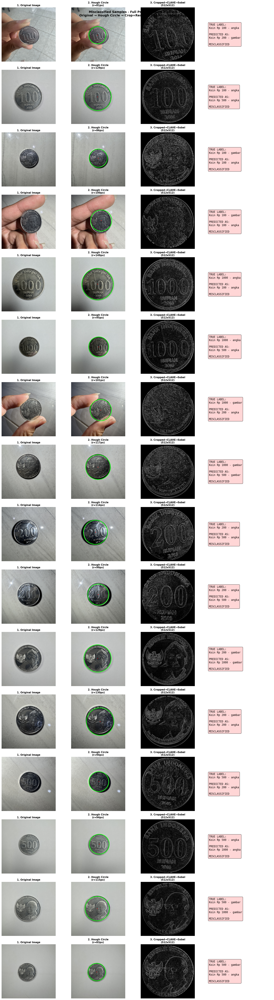


✓ Visualisasi 16 sample yang salah diprediksi telah dibuat!
  Pipeline: Original → Hough Circle → Crop+Resize(512×512) → CLAHE → Sobel
  Disimpan di: D:\dev\semester5\pengolahan-citra\projek-edge-detection\results\coin_classification_splitted\visualizations\misclassified_samples.png


In [56]:
# Visualisasi gambar yang salah diprediksi dengan full preprocessing pipeline
from preprocessing import crop_coin_to_circle

if len(misclassified_samples) > 0:
    num_samples = len(misclassified_samples)
    cols = 4  # Original, Hough Circle, Cropped+Edge, Info
    
    fig, axes = plt.subplots(num_samples, cols, figsize=(18, num_samples * 4))
    
    # Handle case when only 1 row
    if num_samples == 1:
        axes = axes.reshape(1, -1)
    
    for idx, sample in enumerate(misclassified_samples):
        img = sample['image']
        true_label = sample['true_label']
        pred_label = sample['pred_label']
        edges = sample['edges']
        circle_info = sample['circle_info']
        
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        # Draw circle on image
        img_with_circle = img.copy()
        if circle_info:
            x, y, r = circle_info
            cv2.circle(img_with_circle, (x, y), r, (0, 255, 0), 3)
            cv2.circle(img_with_circle, (x, y), 3, (0, 0, 255), -1)
        
        # Apply full preprocessing pipeline to show final result
        segmented, _, _ = detect_and_segment_coin(img, edge_method='sobel', use_clahe=True)
        cropped = crop_coin_to_circle(segmented, circle_info, IMAGE_SIZE)
        edges_cropped = apply_sobel_edge(cropped, use_clahe=True)  # CLAHE + Sobel on cropped
        
        # Column 1: Original image
        axes[idx, 0].imshow(img_rgb)
        axes[idx, 0].set_title('1. Original Image', fontsize=11, fontweight='bold')
        axes[idx, 0].axis('off')
        
        # Column 2: Hough Circle Detection
        axes[idx, 1].imshow(cv2.cvtColor(img_with_circle, cv2.COLOR_BGR2RGB))
        if circle_info:
            axes[idx, 1].set_title(f'2. Hough Circle\n(r={circle_info[2]}px)', fontsize=11, fontweight='bold')
        else:
            axes[idx, 1].set_title('2. Hough Circle\n(not detected)', fontsize=11, fontweight='bold')
        axes[idx, 1].axis('off')
        
        # Column 3: Cropped + Resized + CLAHE + Sobel Edge
        axes[idx, 2].imshow(edges_cropped, cmap='gray')
        axes[idx, 2].set_title(f'3. Cropped→CLAHE→Sobel\n({IMAGE_SIZE[0]}x{IMAGE_SIZE[1]})', fontsize=11, fontweight='bold')
        axes[idx, 2].axis('off')
        
        # Column 4: Info text
        axes[idx, 3].axis('off')
        info_text = f"TRUE LABEL:\n{class_names[true_label]}\n\n"
        info_text += f"PREDICTED AS:\n{class_names[pred_label]}\n\n"
        info_text += f"MISCLASSIFIED"
        
        axes[idx, 3].text(0.1, 0.5, info_text, 
                         fontsize=12, 
                         verticalalignment='center',
                         bbox=dict(boxstyle='round', facecolor='#ffcccc', alpha=0.8),
                         family='monospace')
    
    plt.suptitle(f'Misclassified Samples - Full Preprocessing Pipeline\n'
                 f'Original → Hough Circle → Crop+Resize → CLAHE → Sobel Edge', 
                 fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.savefig(RESULTS_DIR / 'visualizations' / 'misclassified_samples.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    print(f"\n✓ Visualisasi {num_samples} sample yang salah diprediksi telah dibuat!")
    print(f"  Pipeline: Original → Hough Circle → Crop+Resize({IMAGE_SIZE[0]}×{IMAGE_SIZE[1]}) → CLAHE → Sobel")
    print(f"  Disimpan di: {RESULTS_DIR / 'visualizations' / 'misclassified_samples.png'}")
else:
    print("Tidak ada sample yang salah diprediksi! Model perfect!")

In [57]:
from collections import defaultdict

confusion_pairs = defaultdict(int)

for idx in misclassified_indices:
    true_label = y_test_sobel[idx]
    pred_label = y_pred_rf_sobel[idx]
    pair = f"{class_names[true_label]} → {class_names[pred_label]}"
    confusion_pairs[pair] += 1

print("Top confusion pairs:")
sorted_pairs = sorted(confusion_pairs.items(), key=lambda x: x[1], reverse=True)
for pair, count in sorted_pairs[:10]:
    print(f"  {pair}: {count}x")

Top confusion pairs:
  Koin Rp 200 - gambar → Koin Rp 1000 - gambar: 6x
  Koin Rp 1000 - gambar → Koin Rp 200 - angka: 6x
  Koin Rp 1000 - gambar → Koin Rp 200 - gambar: 6x
  Koin Rp 500 - gambar → Koin Rp 100 - angka: 6x
  Koin Rp 500 - gambar → Koin Rp 1000 - gambar: 5x
  Koin Rp 500 - angka → Koin Rp 100 - gambar: 5x
  Koin Rp 1000 - angka → Koin Rp 100 - angka: 4x
  Koin Rp 200 - angka → Koin Rp 500 - angka: 4x
  Koin Rp 100 - angka → Koin Rp 500 - angka: 4x
  Koin Rp 500 - angka → Koin Rp 100 - angka: 4x


## 16. Save Model Terbaik

In [58]:
import pickle

MODELS_DIR = BASE_DIR / 'models'
MODELS_DIR.mkdir(exist_ok=True)

# Determine best model from comparison
best_model_row = comparison_df.iloc[0]
print(f"Best Model: {best_model_row['Model']}")
print(f"Accuracy: {best_model_row['Accuracy']:.4f}\n")

# Save the best model (8-class version)
best_model_name = 'coin_classifier_8class'

# Determine which model to save based on best performance
if 'Sobel' in best_model_row['Model']:
    if 'Random Forest' in best_model_row['Model']:
        model_to_save = rf_sobel
        scaler_to_save = scaler_rf_sobel
    else:
        model_to_save = svm_sobel
        scaler_to_save = scaler_rf_sobel  # Same scaler for Sobel
else:
    if 'Random Forest' in best_model_row['Model']:
        model_to_save = rf_canny
        scaler_to_save = scaler_rf_canny
    else:
        model_to_save = svm_canny
        scaler_to_save = scaler_rf_canny  # Same scaler for Canny

model_path = MODELS_DIR / f'{best_model_name}_model.pkl'
with open(model_path, 'wb') as f:
    pickle.dump(model_to_save, f)

scaler_path = MODELS_DIR / f'{best_model_name}_scaler.pkl'
with open(scaler_path, 'wb') as f:
    pickle.dump(scaler_to_save, f)

# Also save class names for inference
class_names_path = MODELS_DIR / f'{best_model_name}_classes.pkl'
with open(class_names_path, 'wb') as f:
    pickle.dump(class_names, f)

print(f"Model saved: {model_path.relative_to(BASE_DIR)}")
print(f"Scaler saved: {scaler_path.relative_to(BASE_DIR)}")
print(f"Classes saved: {class_names_path.relative_to(BASE_DIR)}")
print(f"\nClasses ({len(class_names)}):")
for i, name in enumerate(class_names):
    print(f"  {i}: {name}")

Best Model: Random Forest + Canny
Accuracy: 0.8781

Model saved: models\coin_classifier_8class_model.pkl
Scaler saved: models\coin_classifier_8class_scaler.pkl
Classes saved: models\coin_classifier_8class_classes.pkl

Classes (8):
  0: Koin Rp 100 - angka
  1: Koin Rp 100 - gambar
  2: Koin Rp 1000 - angka
  3: Koin Rp 1000 - gambar
  4: Koin Rp 200 - angka
  5: Koin Rp 200 - gambar
  6: Koin Rp 500 - angka
  7: Koin Rp 500 - gambar
